**Materia: Visión por Computadora 1**

Alumno: Ezequiel Alejandro Caamaño

Cohorte: 18va.

Trabajo Práctico Nro. 3

Objetivo:
Encontrar el logotipo de la gaseosa dentro de las imágenes provistas en Material_TPs/TP3/images a partir del templateMaterial_TPs/TP3/template

1.
(4 puntos) Obtener una detección del logo en cada imagen sin falsos positivos

2.
(4 puntos) Plantear y validar un algoritmo para múltiples detecciones en la image ncoca_multi.png con el mismo témplate del ítem1

3.
(2 puntos) Generalizar el algoritmo del item2 para todas las imágenes.


Visualizar los resultados con bounding boxes en cada imagen mostrando el nivel dec onfianza de la detección

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Google Drive montado correctamente
Directorio para resultados creado: resultados_deteccion_logo_alternativo
Template cargado: pattern.png - (175, 400, 3)
Imagen cargada: logo_1.png - (450, 687, 3)
Imagen cargada: coca_logo_2.png - (363, 233, 3)
Imagen cargada: coca_multi.png - (598, 799, 3)
Imagen cargada: coca_retro_1.png - (493, 715, 3)
Imagen cargada: coca_logo_1.png - (500, 207, 3)
Imagen cargada: coca_retro_2.png - (429, 715, 3)
Imagen cargada: COCA-COLA-LOGO.jpg - (1389, 1389, 3)

Total: 7 imágenes cargadas


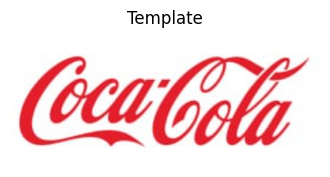

Dimensiones del template: (175, 400, 3)


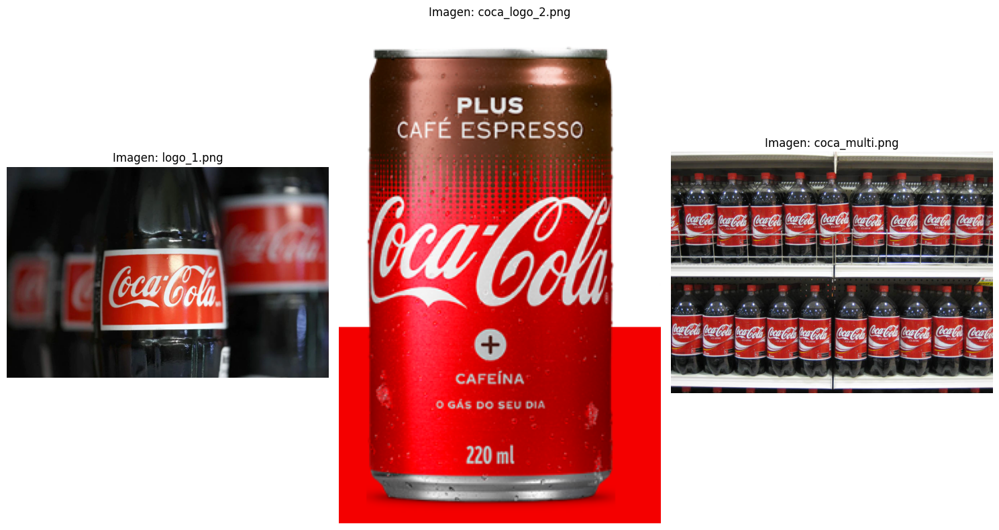


ITEM 1: DETECCIÓN DE UN SOLO LOGOTIPO (UMBRAL 0.6)


Iniciando detección de logo único en cada imagen (umbral: {threshold}):
--------------------------------------------------
Procesando imagen: logo_1.png
Valor de confianza (max_val) en detección única: 1.0000
  Logo detectado con confianza: 0.3369


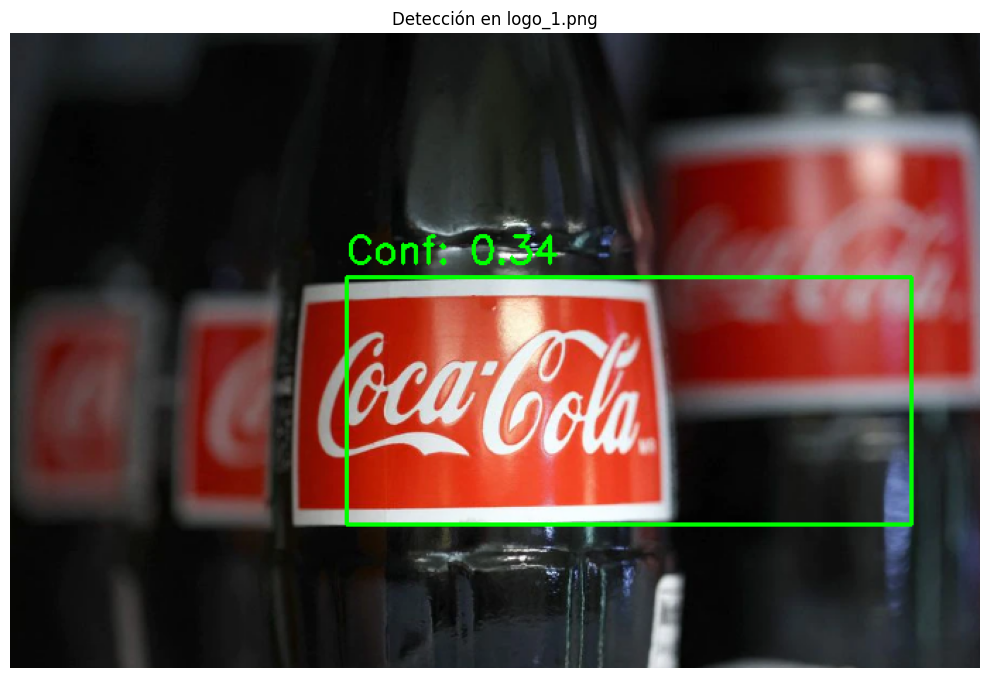

ADVERTENCIA: Imagen coca_logo_2.png es demasiado pequeña ((363, 233)) para el template ((175, 400)). Omitiendo.
Procesando imagen: coca_multi.png
Valor de confianza (max_val) en detección única: 1.0000
  Logo detectado con confianza: 0.4755


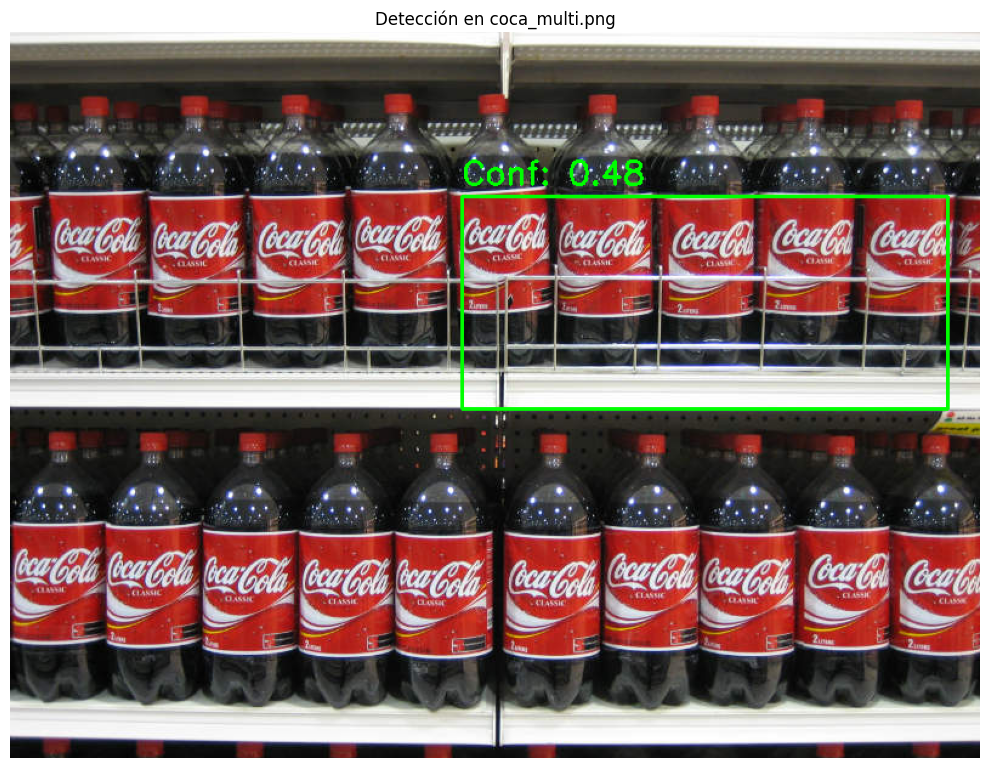

Procesando imagen: coca_retro_1.png
Valor de confianza (max_val) en detección única: 0.4827
  Logo detectado con confianza: 0.8722


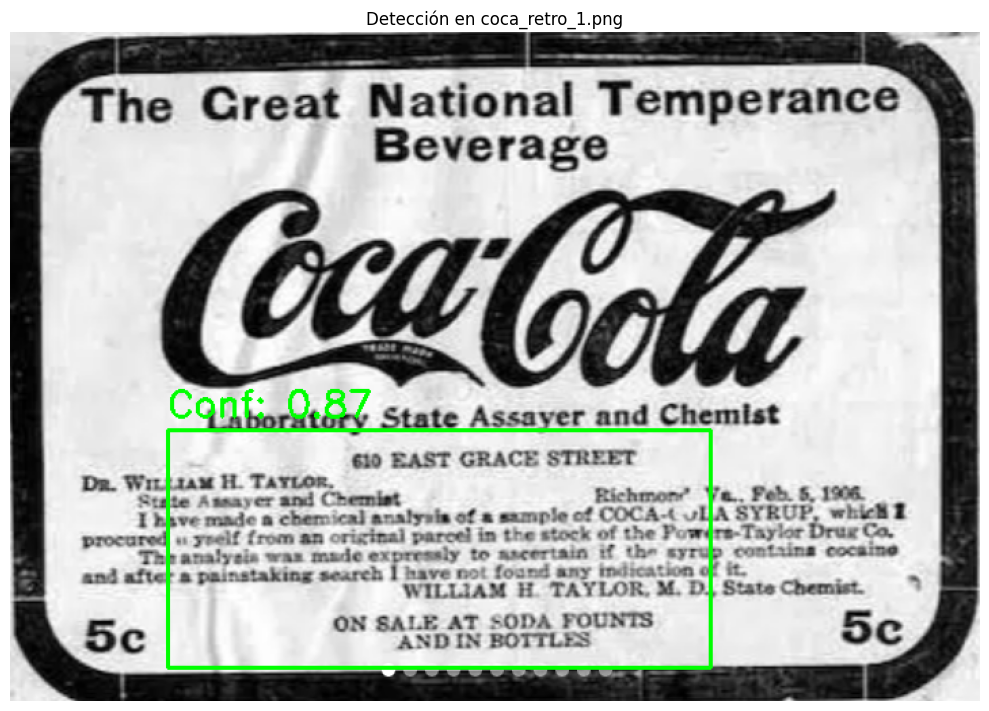

ADVERTENCIA: Imagen coca_logo_1.png es demasiado pequeña ((500, 207)) para el template ((175, 400)). Omitiendo.
Procesando imagen: coca_retro_2.png
Valor de confianza (max_val) en detección única: 1.0000
  Logo detectado con confianza: 0.3981


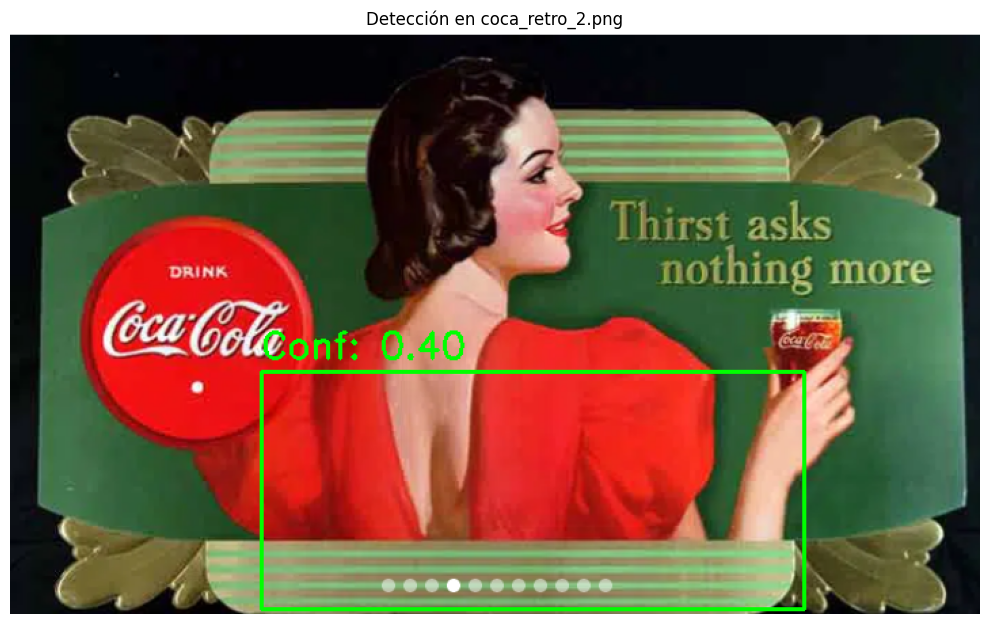

Procesando imagen: COCA-COLA-LOGO.jpg
Valor de confianza (max_val) en detección única: 1.0000
  Logo detectado con confianza: 0.8890


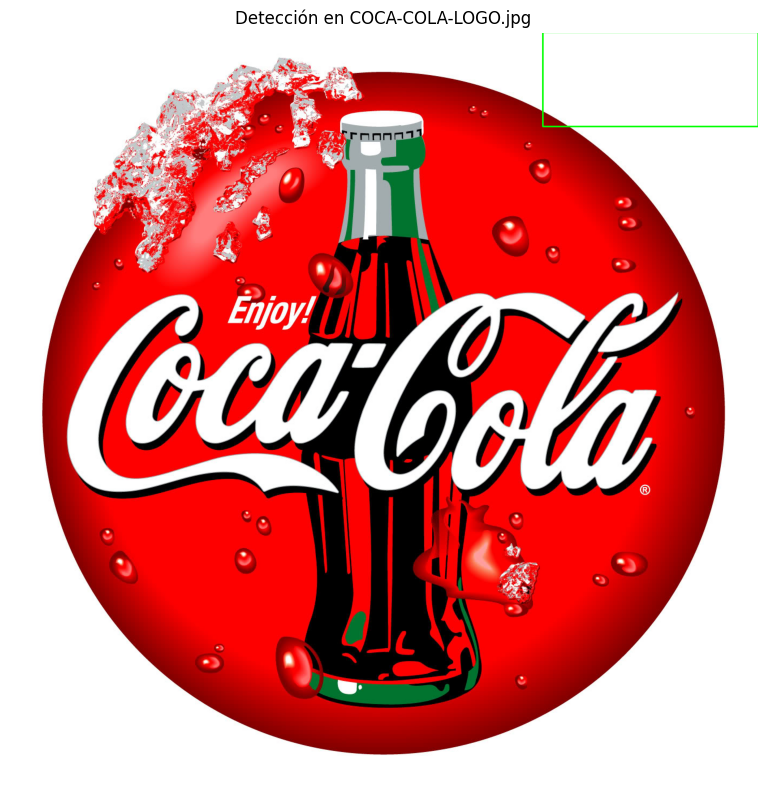


ITEM 2: DETECCIÓN MÚLTIPLE EN COCA_MULTI.PNG (UMBRAL 0.4)


Realizando detección múltiple en coca_multi.png (umbral: 0.4):
--------------------------------------------------
Valor de confianza (max_val) en detección múltiple (primera búsqueda): 0.8325
Se detectaron 4 logos
  Logo 1: Posición=(371, 133), Tamaño=(400, 175), Confianza=0.8325
  Logo 2: Posición=(241, 412), Tamaño=(400, 175), Confianza=0.8246
  Logo 3: Posición=(37, 134), Tamaño=(400, 175), Confianza=0.8230
  Logo 4: Posición=(211, 10), Tamaño=(400, 175), Confianza=0.8183


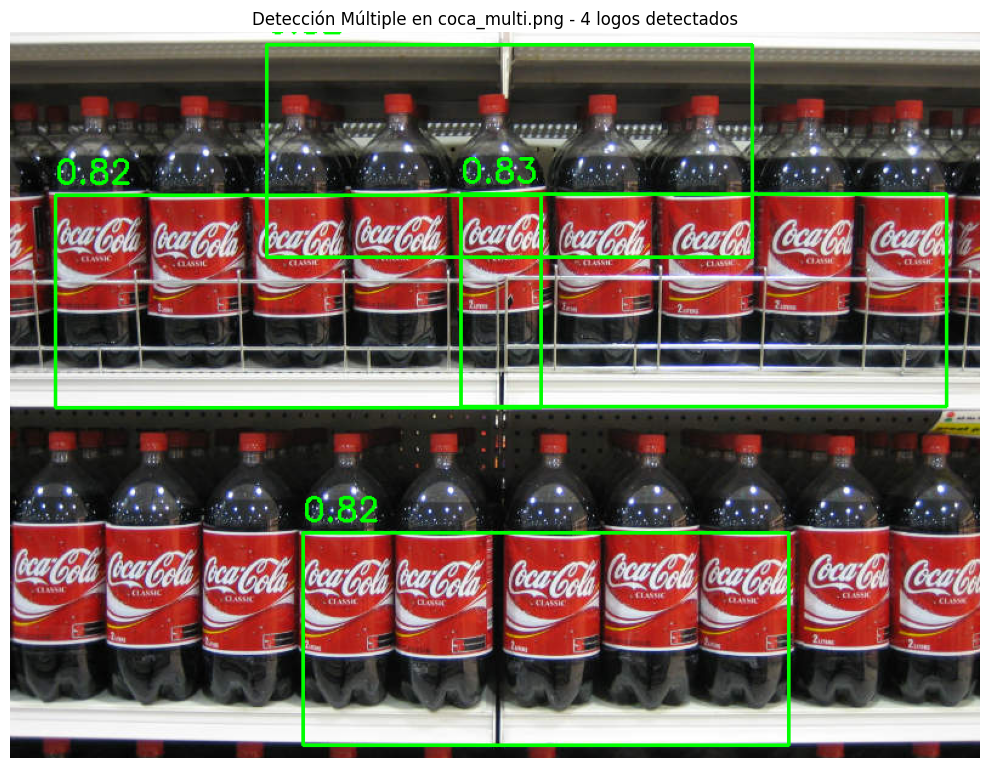


ITEM 3: GENERALIZACIÓN A TODAS LAS IMÁGENES (UMBRAL 0.4)


Generalizando detección múltiple a todas las imágenes (umbral: 0.4):
--------------------------------------------------
Procesando imagen: logo_1.png
Valor de confianza (max_val) en detección múltiple (primera búsqueda): 0.8126
  Se detectaron 2 logos en logo_1.png


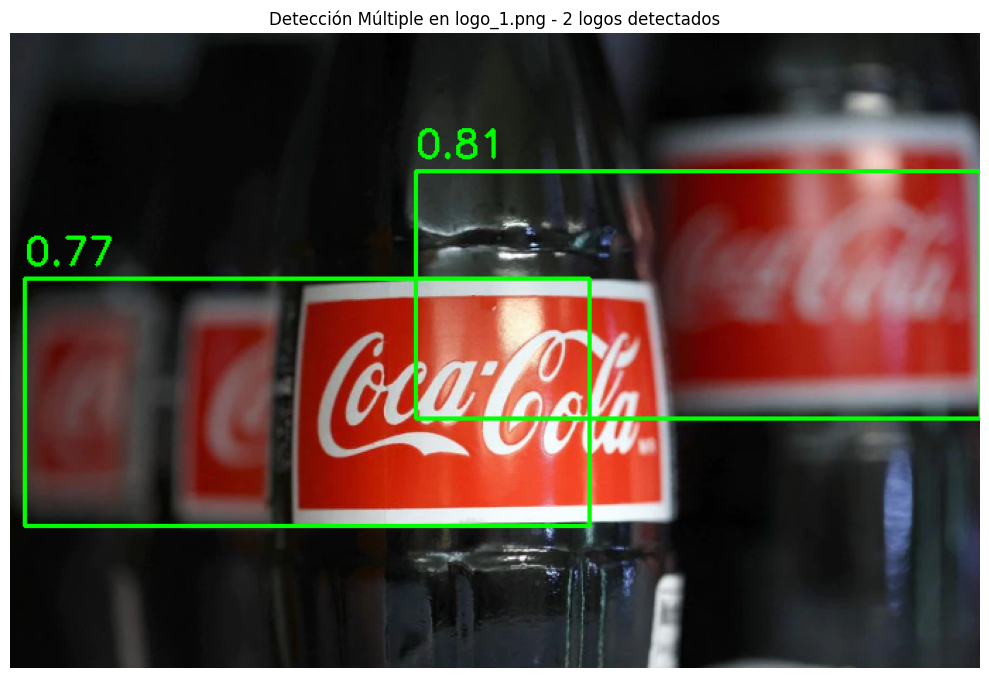

ADVERTENCIA: Imagen coca_logo_2.png es demasiado pequeña ((363, 233)) para el template ((175, 400)). Omitiendo detección múltiple.
Procesando imagen: coca_multi.png
Valor de confianza (max_val) en detección múltiple (primera búsqueda): 0.8325
  Se detectaron 4 logos en coca_multi.png


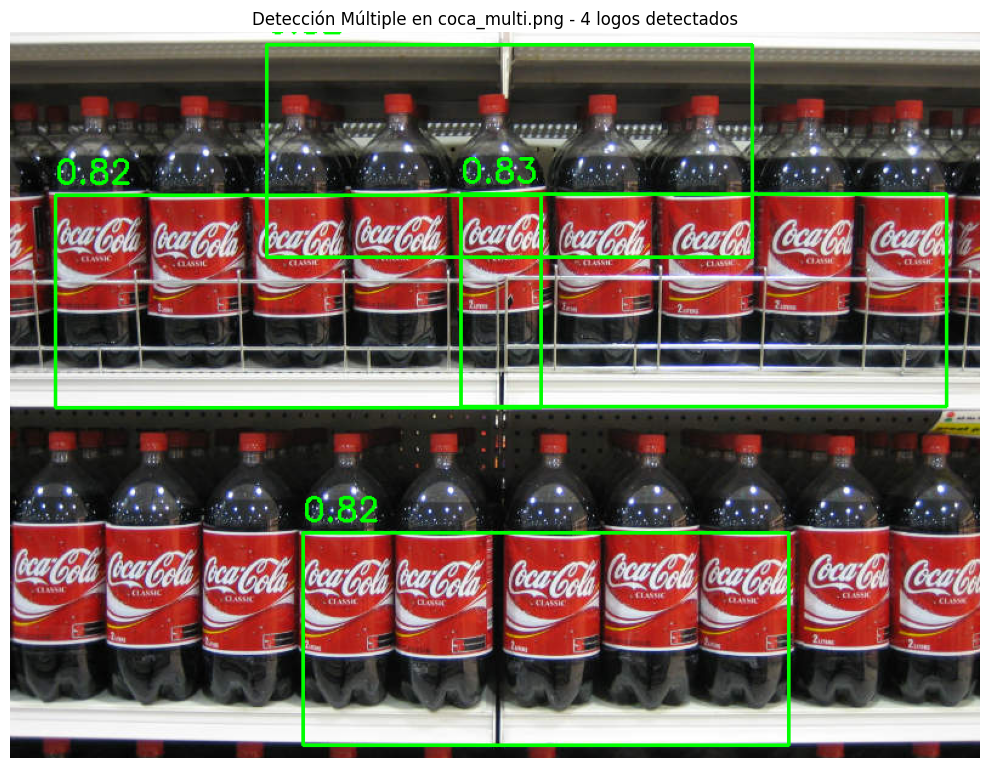

Procesando imagen: coca_retro_1.png
Valor de confianza (max_val) en detección múltiple (primera búsqueda): 0.9402
  Se detectaron 2 logos en coca_retro_1.png


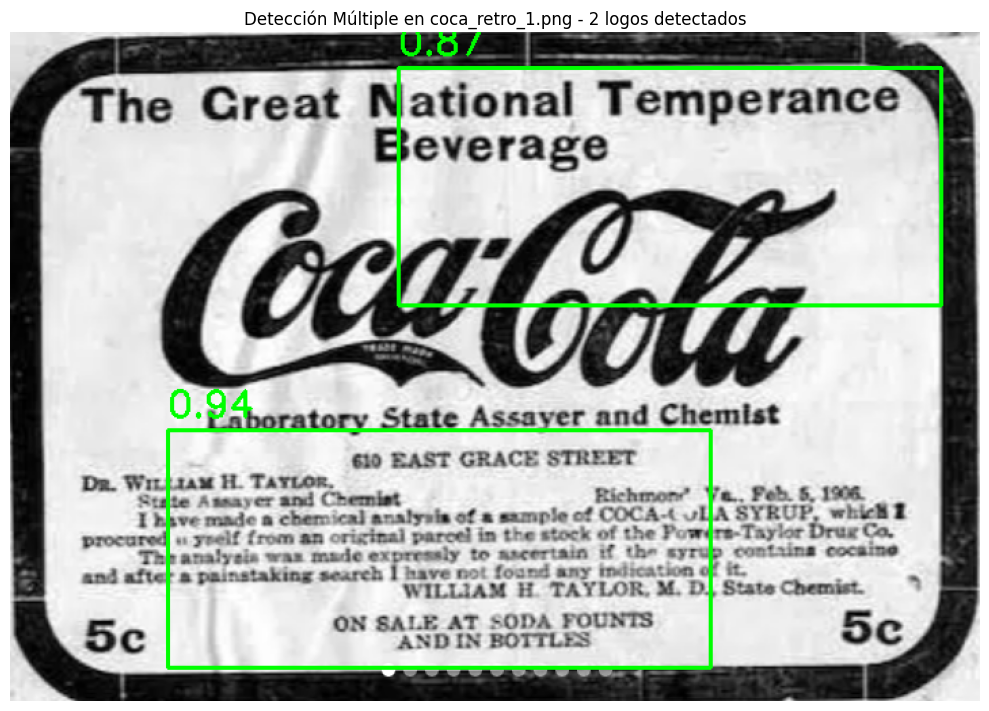

ADVERTENCIA: Imagen coca_logo_1.png es demasiado pequeña ((500, 207)) para el template ((175, 400)). Omitiendo detección múltiple.
Procesando imagen: coca_retro_2.png
Valor de confianza (max_val) en detección múltiple (primera búsqueda): 0.8426
  Se detectaron 2 logos en coca_retro_2.png


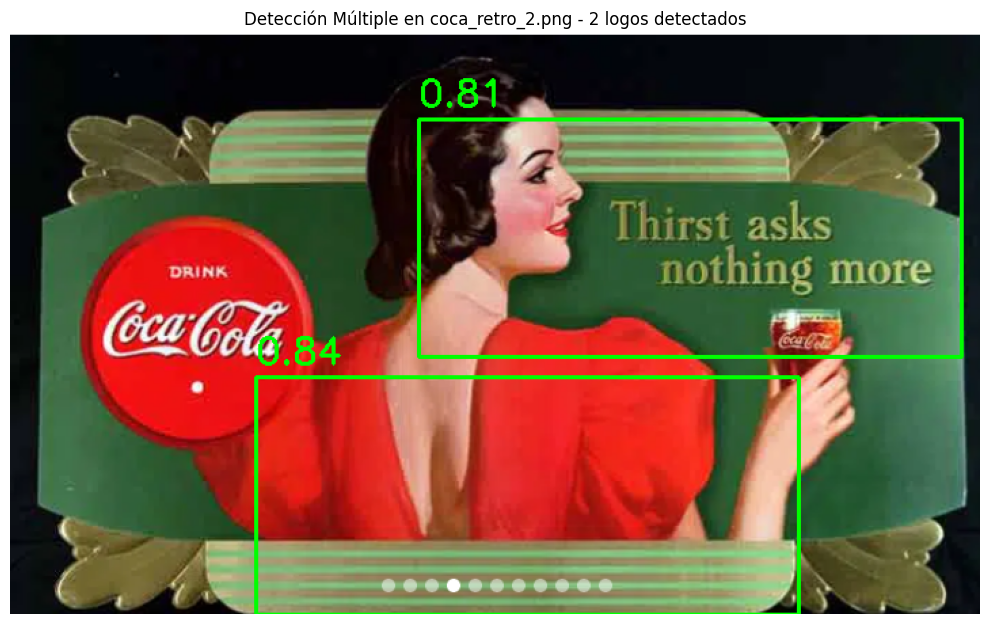

Procesando imagen: COCA-COLA-LOGO.jpg
Valor de confianza (max_val) en detección múltiple (primera búsqueda): 0.9490
  Se detectaron 4 logos en COCA-COLA-LOGO.jpg


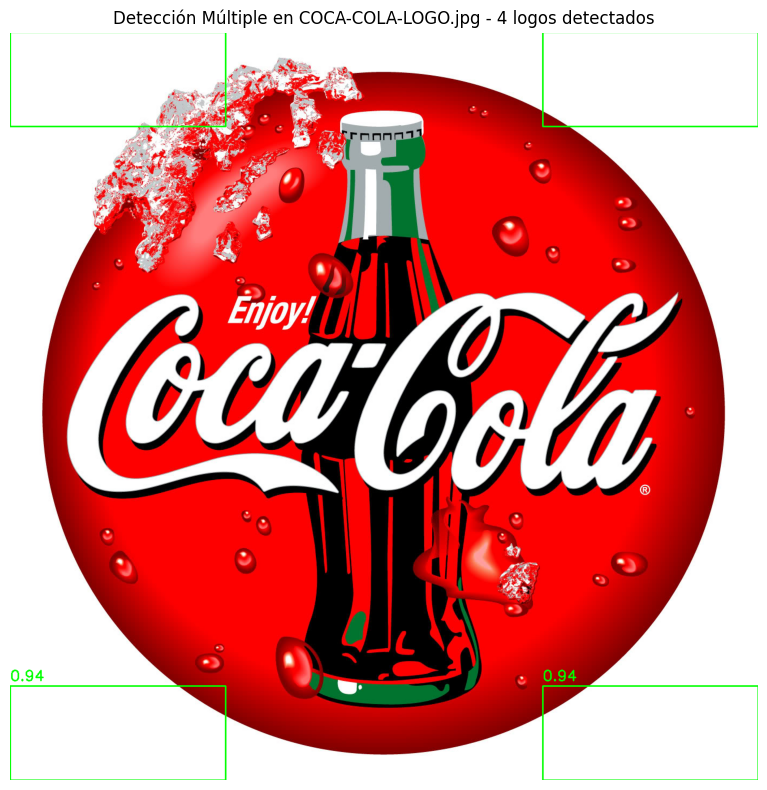


INFORME DE RESULTADOS

| Imagen | Detección Única | Detección Múltiple |
|--------|-----------------|-------------------|
| logo_1.png | Detectado | 2 logos |
| coca_logo_2.png | Omitido | 0 logos |
| coca_multi.png | Detectado | 4 logos |
| coca_retro_1.png | Detectado | 2 logos |
| coca_logo_1.png | Omitido | 0 logos |
| coca_retro_2.png | Detectado | 2 logos |
| COCA-COLA-LOGO.jpg | Detectado | 4 logos |

Informe completo guardado en: resultados_deteccion_logo_alternativo/informe_deteccion.txt

RESUMEN FINAL

Todas las imágenes con detecciones han sido guardadas en: resultados_deteccion_logo_alternativo

Resultados de cada ítem:
1. Detección única: Se completó en 7 imágenes
2. Detección múltiple en coca_multi.png: Se detectaron 4 logos
3. Generalización a todas las imágenes: Se procesaron 7 imágenes

Proceso completado con éxito.


In [ ]:

import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
from IPython.display import display, Image, clear_output

try:
    from google.colab import drive
    drive.mount('/content/drive')
    print("Google Drive montado correctamente")
except:
    print("Ejecutando en un entorno sin acceso a Google Drive o Google Drive ya está montado")


base_path = "/content/drive/MyDrive/VC1/TP3/"

template_path = "/content/drive/MyDrive/VC1/TP3/template"
images_path = "/content/drive/MyDrive/VC1/TP3/images"

results_dir = "resultados_deteccion_logo_alternativo"
os.makedirs(results_dir, exist_ok=True)
print(f"Directorio para resultados creado: {results_dir}")




def load_images(base_path, template_path, images_path):


    if not os.path.exists(template_path):
        print(f"ERROR: La ruta del template '{template_path}' no existe.")
        return None, {}

    if not os.path.exists(images_path):
        print(f"ERROR: La ruta de imágenes '{images_path}' no existe.")
        return None, {}

    template_files = glob.glob(os.path.join(template_path, "*"))
    if not template_files:
        print(f"ERROR: No se encontraron archivos de template en '{template_path}'")
        return None, {}

    template = cv2.imread(template_files[0])
    if template is None:
        print(f"ERROR: No se pudo cargar el template: {template_files[0]}")
        return None, {}

    print(f"Template cargado: {os.path.basename(template_files[0])} - {template.shape}")

    image_files = glob.glob(os.path.join(images_path, "*.png")) + glob.glob(os.path.join(images_path, "*.jpg"))
    if not image_files:
        print(f"ERROR: No se encontraron imágenes en '{images_path}'")
        return template, {}

    images = {}
    for img_path in image_files:
        img_name = os.path.basename(img_path)
        img = cv2.imread(img_path)
        if img is not None:
            images[img_name] = img
            print(f"Imagen cargada: {img_name} - {img.shape}")
        else:
            print(f"ADVERTENCIA: No se pudo cargar la imagen: {img_path}")

    print(f"\nTotal: {len(images)} imágenes cargadas")
    return template, images


template, images = load_images(base_path, template_path, images_path)

if template is not None:
    plt.figure(figsize=(4, 4))
    plt.imshow(cv2.cvtColor(template, cv2.COLOR_BGR2RGB))
    plt.title("Template")
    plt.axis('off')
    plt.show()

    print(f"Dimensiones del template: {template.shape}")


    plt.figure(figsize=(15, 10))
    count = min(3, len(images))
    for i, (name, img) in enumerate(list(images.items())[:count]):
        plt.subplot(1, count, i+1)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(f"Imagen: {name}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()



# Función para detección básica con template matching
def detect_single_logo(image, template, method=cv2.TM_CCORR_NORMED, threshold=0.7):
    h_img, w_img = image.shape[:2]
    h_temp, w_temp = template.shape[:2]

    if h_img < h_temp or w_img < w_temp:
        print(f"ADVERTENCIA: Imagen demasiado pequeña ({image.shape[:2]}) para el template ({template.shape[:2]}). Omitiendo.")
        return None, 0.0

    result = cv2.matchTemplate(image, template, method)
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)
    print(f"Valor de confianza (max_val) en detección única: {max_val:.4f}")


    if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
        match_loc = min_loc
        match_val = 1 - min_val
    else:
        match_loc = max_loc
        match_val = max_val

    h, w = template.shape[:2]

    match_rect = (match_loc[0], match_loc[1], w, h)

    if match_val >= threshold:
        return match_rect, match_val
    else:
        return None, match_val

# Función para visualizar resultados
def draw_detection(image, match_rect, confidence, title="Detección de Logo"):
    result_img = image.copy()

    if match_rect is not None:
        x, y, w, h = match_rect

        cv2.rectangle(result_img, (x, y), (x+w, y+h), (0, 255, 0), 2)

        text = f"Conf: {confidence:.2f}"
        cv2.putText(result_img, text, (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)


    plt.figure(figsize=(10, 8))
    plt.imshow(cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

    return result_img

# Procesar todas las imágenes con detección única
def detect_single_logo_all_images(images, template, method=cv2.TM_CCORR_NORMED, threshold=0.7):
    results = {}

    print("\nIniciando detección de logo único en cada imagen (umbral: {threshold}):")
    print("-" * 50)

    for name, img in images.items():
        h_img, w_img = img.shape[:2]
        h_temp, w_temp = template.shape[:2]

        if h_img < h_temp or w_img < w_temp:
            print(f"ADVERTENCIA: Imagen {name} es demasiado pequeña ({img.shape[:2]}) para el template ({template.shape[:2]}). Omitiendo.")
            results[name] = {'match_rect': None, 'confidence': 0.0, 'status': 'Omitido'}
            continue

        print(f"Procesando imagen: {name}")
        match_rect, confidence = detect_single_logo(img, template, method, threshold)

        if match_rect is not None:
            print(f"  Logo detectado con confianza: {confidence:.4f}")
            results[name] = {
                'match_rect': match_rect,
                'confidence': confidence,
                'status': 'Detectado'
            }
        else:
            print(f"  No se detectó logo por encima del umbral (max confianza: {confidence:.4f})")
            results[name] = {
                'match_rect': None,
                'confidence': confidence,
                'status': 'No detectado'
            }

        result_img = draw_detection(img, match_rect, confidence, f"Detección en {name}")

        output_path = os.path.join(results_dir, f"single_detection_{name}")
        cv2.imwrite(output_path, cv2.cvtColor(result_img, cv2.COLOR_RGB2BGR))

    return results

# Ejecutar detección de logo único
print("\n" + "="*50)
print("ITEM 1: DETECCIÓN DE UN SOLO LOGOTIPO (UMBRAL 0.6)")
print("="*50 + "\n")

detection_method = cv2.TM_SQDIFF_NORMED
detection_threshold_single = 0.2

single_detection_results = detect_single_logo_all_images(images, template, detection_method, detection_threshold_single)

# Detección de múltiples logotipos (Item 2)

# #Función para detección múltiple con template matching
def detect_multiple_logos(image, template, method=cv2.TM_CCORR_NORMED, threshold=0.6,
                            overlap_threshold=0.1, max_detections=20):
    h_img, w_img = image.shape[:2]
    h_temp, w_temp = template.shape[:2]

    if h_img < h_temp or w_img < w_temp:
        print(f"ADVERTENCIA: Imagen demasiado pequeña ({image.shape[:2]}) para el template ({template.shape[:2]}). Omitiendo detección múltiple.")
        return []

    h, w = template.shape[:2]

    result = cv2.matchTemplate(image, template, method)
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)
    print(f"Valor de confianza (max_val) en detección múltiple (primera búsqueda): {max_val:.4f}")

    detections = []

    for _ in range(max_detections):
        min_val_iter, max_val_iter, min_loc_iter, max_loc_iter = cv2.minMaxLoc(result)

        if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
            match_loc = min_loc_iter
            confidence = 1 - min_val_iter
        else:
            match_loc = max_loc_iter
            confidence = max_val_iter

        if confidence < threshold:
            break

        x, y = match_loc
        detection = (x, y, w, h, confidence)
        detections.append(detection)

        mask_size = int(overlap_threshold * min(w, h))
        y1 = max(0, y - mask_size)
        y2 = min(result.shape[0], y + h + mask_size)
        x1 = max(0, x - mask_size)
        x2 = min(result.shape[1], x + w + mask_size)

        result[y1:y2, x1:x2] = -1

    return detections

# Función para aplicar supresión de no máximos (NMS)
def non_max_suppression(detections, overlap_threshold=0.1):
    if len(detections) == 0:
        return []

    detections.sort(key=lambda x: x[4], reverse=True)

    final_detections = []

    while len(detections) > 0:

        best_detection = detections[0]
        final_detections.append(best_detection)


        remaining_detections = []
        best_x1, best_y1, best_w, best_h, _ = best_detection
        best_x2, best_y2 = best_x1 + best_w, best_y1 + best_h
        best_area = best_w * best_h

        for detection in detections[1:]:
            x1, y1, w, h, conf = detection
            x2, y2 = x1 + w, y1 + h

            inter_x1 = max(best_x1, x1)
            inter_y1 = max(best_y1, y1)
            inter_x2 = min(best_x2, x2)
            inter_y2 = min(best_y2, y2)

            if inter_x1 < inter_x2 and inter_y1 < inter_y2:
                inter_area = (inter_x2 - inter_x1) * (inter_y2 - inter_y1)
                detection_area = w * h
                overlap = inter_area / float(detection_area + best_area - inter_area)

                if overlap < overlap_threshold:
                    remaining_detections.append(detection)
            else:
                remaining_detections.append(detection)

        detections = remaining_detections

    return final_detections

# Función para visualizar múltiples detecciones
def draw_multiple_detections(image, detections, title="Detección Múltiple de Logos"):
    result_img = image.copy()

    for detection in detections:
        x, y, w, h, confidence = detection
        cv2.rectangle(result_img, (x, y), (x+w, y+h), (0, 255, 0), 2)
        text = f"{confidence:.2f}"
        cv2.putText(result_img, text, (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

    plt.figure(figsize=(10, 8))
    plt.imshow(cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB))
    plt.title(f"{title} - {len(detections)} logos detectados")
    plt.axis('off')
    plt.tight_layout()
    plt.show()

    return result_img


# Detección múltiple en coca_multi.png (Item 2)
def detect_multi_logo_coca(images, template, method=cv2.TM_CCORR_NORMED,
                            threshold=0.6, overlap_threshold=0.1):
    target_image_name = "coca_multi.png"
    if target_image_name not in images:
        print(f"ERROR: No se encontró la imagen {target_image_name}")
        return []

    image = images[target_image_name]
    h_img, w_img = image.shape[:2]
    h_temp, w_temp = template.shape[:2]

    if h_img < h_temp or w_img < w_temp:
        print(f"ADVERTENCIA: Imagen {target_image_name} es demasiado pequeña ({image.shape[:2]}) para el template ({template.shape[:2]}). Omitiendo detección múltiple.")
        return []

    print(f"\nRealizando detección múltiple en {target_image_name} (umbral: {threshold}):")
    print("-" * 50)

    detections = detect_multiple_logos(image, template, method, threshold, overlap_threshold)

    final_detections = non_max_suppression(detections, overlap_threshold)

    print(f"Se detectaron {len(final_detections)} logos")
    for i, detection in enumerate(final_detections):
        x, y, w, h, conf = detection
        print(f"  Logo {i+1}: Posición=({x}, {y}), Tamaño=({w}, {h}), Confianza={conf:.4f}")

    result_img = draw_multiple_detections(image, final_detections, f"Detección Múltiple en {target_image_name}")

    output_path = os.path.join(results_dir, f"multi_detection_{target_image_name}")
    cv2.imwrite(output_path, cv2.cvtColor(result_img, cv2.COLOR_RGB2BGR))

    return final_detections

# Ejecutar detección múltiple en coca_multi.png
print("\n" + "="*50)
print("ITEM 2: DETECCIÓN MÚLTIPLE EN COCA_MULTI.PNG (UMBRAL 0.4)")
print("="*50 + "\n")

multi_detection_method = cv2.TM_CCORR_NORMED
multi_detection_threshold_multi = 0.4  # Umbral más bajo
overlap_threshold = 0.1

# Ejecutar detección múltiple
multi_detections_coca = detect_multi_logo_coca(images, template,
                                            multi_detection_method,
                                            multi_detection_threshold_multi,
                                            overlap_threshold)


# Fución para aplicar detección múltiple a todas las imágenes
def detect_multi_logo_all_images(images, template, method=cv2.TM_CCORR_NORMED,
                                 threshold=0.6, overlap_threshold=0.1):
    results = {}

    print(f"\nGeneralizando detección múltiple a todas las imágenes (umbral: {threshold}):")
    print("-" * 50)

    for name, img in images.items():
        h_img, w_img = img.shape[:2]
        h_temp, w_temp = template.shape[:2]

        if h_img < h_temp or w_img < w_temp:
            print(f"ADVERTENCIA: Imagen {name} es demasiado pequeña ({img.shape[:2]}) para el template ({template.shape[:2]}). Omitiendo detección múltiple.")
            results[name] = []
            continue

        print(f"Procesando imagen: {name}")

        detections = detect_multiple_logos(img, template, method, threshold, overlap_threshold)

        final_detections = non_max_suppression(detections, overlap_threshold)

        print(f"  Se detectaron {len(final_detections)} logos en {name}")

        results[name] = final_detections

        result_img = draw_multiple_detections(img, final_detections, f"Detección Múltiple en {name}")

        output_path = os.path.join(results_dir, f"multi_all_{name}")
        cv2.imwrite(output_path, cv2.cvtColor(result_img, cv2.COLOR_RGB2BGR))

    return results

# Ejecutar detección múltiple en todas las imágenes
print("\n" + "="*50)
print("ITEM 3: GENERALIZACIÓN A TODAS LAS IMÁGENES (UMBRAL 0.4)")
print("="*50 + "\n")

# Ejecutar detección múltiple en todas las imágenes
multi_all_results = detect_multi_logo_all_images(images, template,
                                                multi_detection_method,
                                                multi_detection_threshold_multi,
                                                overlap_threshold)

# Crear informe de resultados
def create_detection_report(single_results, multi_results):
    """
    Crea un informe comparativo de ambos métodos de detección

    Args:
        single_results: Resultados de detección única
        multi_results: Resultados de detección múltiple

    Returns:
        None
    """
    print("\n" + "="*50)
    print("INFORME DE RESULTADOS")
    print("="*50 + "\n")

    print("| Imagen | Detección Única | Detección Múltiple |")
    print("|--------|-----------------|-------------------|")

    for name in single_results.keys():
        single_status = single_results[name]['status'] if name in single_results else "No procesado"
        multi_count = len(multi_results[name]) if name in multi_results else 0

        print(f"| {name} | {single_status} | {multi_count} logos |")

    # Guardar informe en archivo
    with open(os.path.join(results_dir, "informe_deteccion.txt"), "w") as f:
        f.write("INFORME DE DETECCIÓN DE LOGOS\n")
        f.write("===========================\n\n")
        f.write("Parámetros utilizados:\n")
        f.write(f"- Método de detección: {multi_detection_method}\n")
        f.write(f"- Umbral de confianza (única): {detection_threshold_single}\n")
        f.write(f"- Umbral de confianza (múltiple): {multi_detection_threshold_multi}\n")
        f.write(f"- Umbral de solapamiento: {overlap_threshold}\n\n")

        f.write("Resultados por imagen:\n")
        f.write("-" * 40 + "\n\n")

        for name in single_results.keys():
            single_conf = single_results[name]['confidence'] if name in single_results else 0
            single_status = single_results[name]['status'] if name in single_results else "No procesado"
            multi_count = len(multi_results[name]) if name in multi_results else 0

            f.write(f"Imagen: {name}\n")
            f.write(f"- Detección única: {single_status} (confianza: {single_conf:.4f})\n")
            f.write(f"- Detección múltiple: {multi_count} logos\n")

            if multi_count > 0:
                f.write("  Detalles de detecciones múltiples:\n")
                for i, detection in enumerate(multi_results[name]):
                    x, y, w, h, conf = detection
                    f.write(f"    Logo {i+1}: Posición=({x}, {y}), Tamaño=({w}, {h}), Confianza={conf:.4f}\n")

            f.write("\n")

    print(f"\nInforme completo guardado en: {os.path.join(results_dir, 'informe_deteccion.txt')}")

# Generar informe de resultados
create_detection_report(single_detection_results, multi_all_results)

# Resumen final
print("\n" + "="*50)
print("RESUMEN FINAL")
print("="*50)
print(f"\nTodas las imágenes con detecciones han sido guardadas en: {results_dir}")
print("\nResultados de cada ítem:")
print(f"1. Detección única: Se completó en {len(single_detection_results)} imágenes")
print(f"2. Detección múltiple en coca_multi.png: Se detectaron {len(multi_detections_coca)} logos")
print(f"3. Generalización a todas las imágenes: Se procesaron {len(multi_all_results)} imágenes")
print("\nProceso completado con éxito.")

# Conclusiones hasta este punto:

Se han ejecutado el código con distintos threholds y solapamientos ya que se detectaban varios falsos positivos. También se trabajo con distintos métodos, observando distintos resultados. pero no se ha detectado hasta el momento mejora que elimine los falsos positivos en las imàgenes con un solo logo, y detecte más logos en la que tiene varios, por lo que se siguen explorando métodos
. Asimismo, se tuvo que utilizar una condiciòn que evalue las dimensiones de las imagenes porque algunas de ellas (dos en particular) eran de dimensiones menores al logo.

- Se observa a su vez que hay un error en el posicionamiento de los boxes, por lo que también hay que corregir.

- En vista de estos resultados, se sigue trabajando puliendo el punto 1, optando por realizar en escala de grises, probar una baterìa de diferentes métodos, prepocesamiento de bordes de Canny y escalar las imagenes. Después analizaremos el resultado.


Directorio para resultados creado: resultados_deteccion_avanzada_gray
Template cargado (grayscale): pattern.png - (175, 400)
Imagen cargada (grayscale): logo_1.png - (450, 687)
Imagen cargada (grayscale): coca_logo_2.png - (363, 233)
Imagen cargada (grayscale): coca_multi.png - (598, 799)
Imagen cargada (grayscale): coca_retro_1.png - (493, 715)
Imagen cargada (grayscale): coca_logo_1.png - (500, 207)
Imagen cargada (grayscale): coca_retro_2.png - (429, 715)
Imagen cargada (grayscale): COCA-COLA-LOGO.jpg - (1389, 1389)

Total: 7 imágenes cargadas


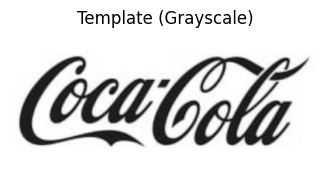

Dimensiones del template (grayscale): (175, 400)

EJECUTANDO ESTRATEGIAS AVANZADAS (ESCALA DE GRISES)


Evaluando métricas para logo_1.png:
  - Método: 4, Confianza: 40271740.0000, Rect: (73, 263, 400, 175)


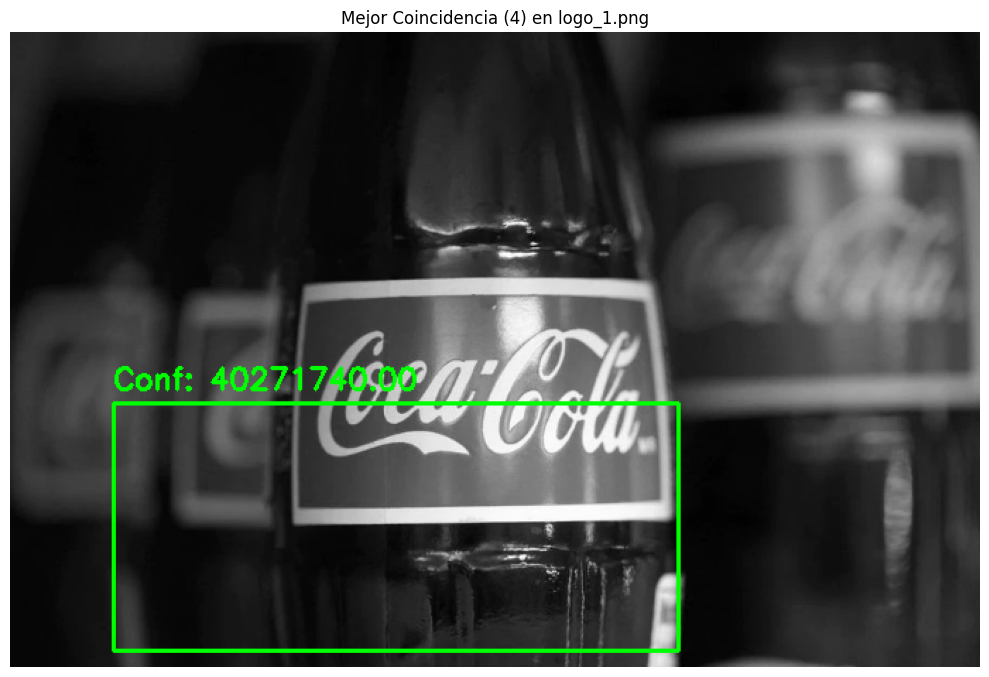

  - Método: 5, Confianza: 0.1517, Rect: (16, 263, 400, 175)
  - Método: 2, Confianza: 1727945088.0000, Rect: (238, 173, 400, 175)


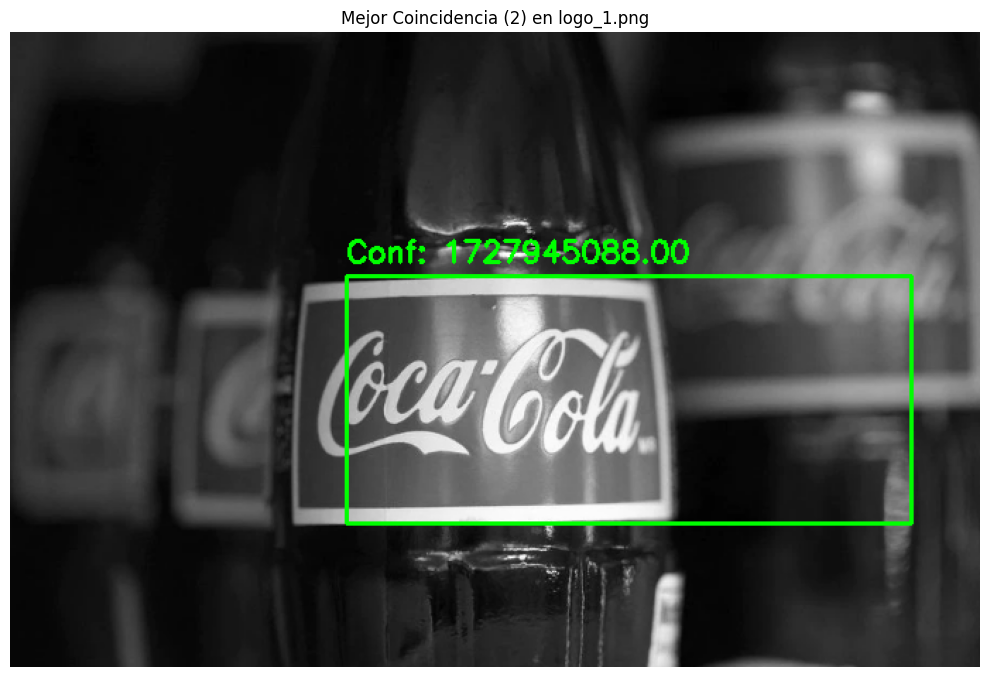

  - Método: 3, Confianza: 0.8359, Rect: (287, 95, 400, 175)
  - Método: 0, Confianza: -1348022015.0000, Rect: (238, 173, 400, 175)
  - Método: 1, Confianza: 0.3521, Rect: (238, 173, 400, 175)

Realizando matching multiescala para logo_1.png (num_scales=20):
  - Escala: 0.20, Confianza: 0.3752, Rect: (377, 182, 80, 35)
  - Escala: 0.29, Confianza: 0.3436, Rect: (349, 290, 117, 51)
  - Escala: 0.39, Confianza: 0.3422, Rect: (298, 279, 155, 68)
  - Escala: 0.48, Confianza: 0.2875, Rect: (18, 28, 193, 84)
  - Escala: 0.58, Confianza: 0.2637, Rect: (197, 329, 231, 101)
  - Escala: 0.67, Confianza: 0.2522, Rect: (204, 325, 269, 117)
  - Escala: 0.77, Confianza: 0.2838, Rect: (3, 0, 307, 134)
  - Escala: 0.86, Confianza: 0.1943, Rect: (0, 50, 345, 151)
  - Escala: 0.96, Confianza: 0.1664, Rect: (251, 283, 383, 167)
  - Escala: 1.05, Confianza: 0.1525, Rect: (8, 263, 421, 184)
  - Escala: 1.15, Confianza: 0.1563, Rect: (0, 6, 458, 200)
  - Escala: 1.24, Confianza: 0.1450, Rect: (145, 233, 496,

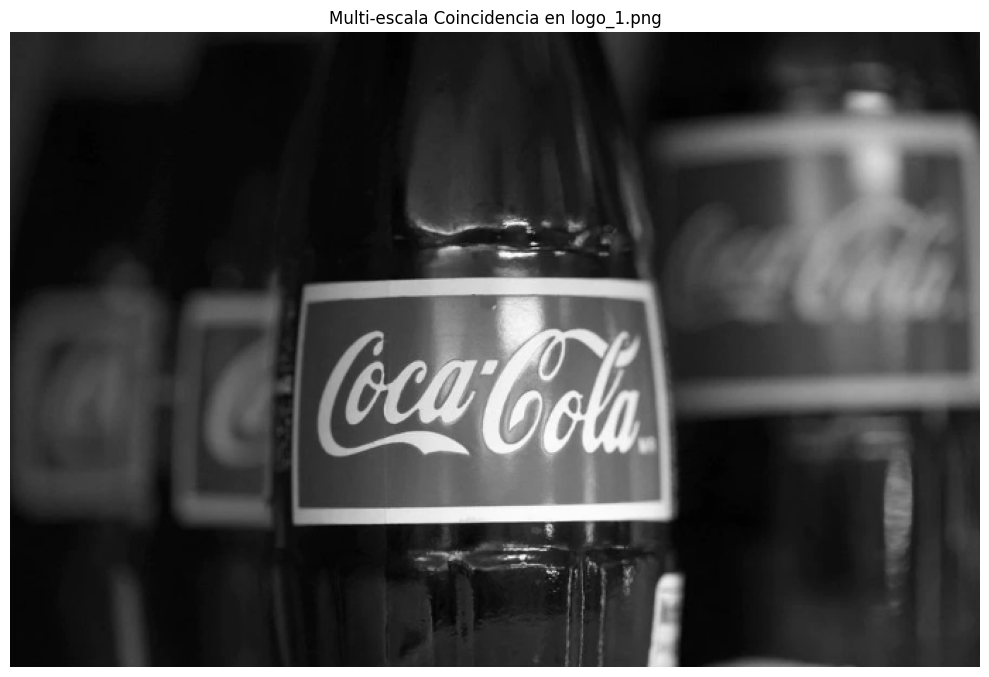


Realizando matching con bordes Canny para logo_1.png (thresh1=100, thresh2=200):
  - Confianza (Canny): 0.0680, Rect: (113, 154, 400, 175)

Evaluando métricas para coca_logo_2.png:
  - Método: 4, Confianza: 0.0000, Rect: None
  - Método: 5, Confianza: 0.0000, Rect: None
  - Método: 2, Confianza: 0.0000, Rect: None
  - Método: 3, Confianza: 0.0000, Rect: None
  - Método: 0, Confianza: 0.0000, Rect: None
  - Método: 1, Confianza: 0.0000, Rect: None

Realizando matching multiescala para coca_logo_2.png (num_scales=20):
  - Escala: 0.20, Confianza: 0.3040, Rect: (69, 13, 80, 35)
  - Escala: 0.29, Confianza: 0.2961, Rect: (91, 12, 117, 51)
  - Escala: 0.39, Confianza: 0.3371, Rect: (60, 10, 155, 68)
  - Escala: 0.48, Confianza: 0.3514, Rect: (18, 2, 193, 84)
  - Escala: 0.58, Confianza: 0.2447, Rect: (0, 5, 231, 101)


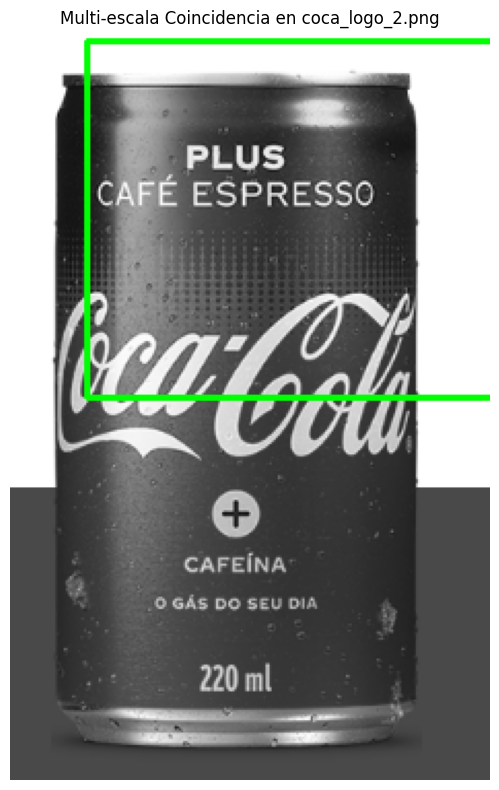


Realizando matching con bordes Canny para coca_logo_2.png (thresh1=100, thresh2=200):
  - Confianza (Canny): 0.0000, Rect: None

Evaluando métricas para coca_multi.png:
  - Método: 4, Confianza: 113270552.0000, Rect: (288, 276, 400, 175)


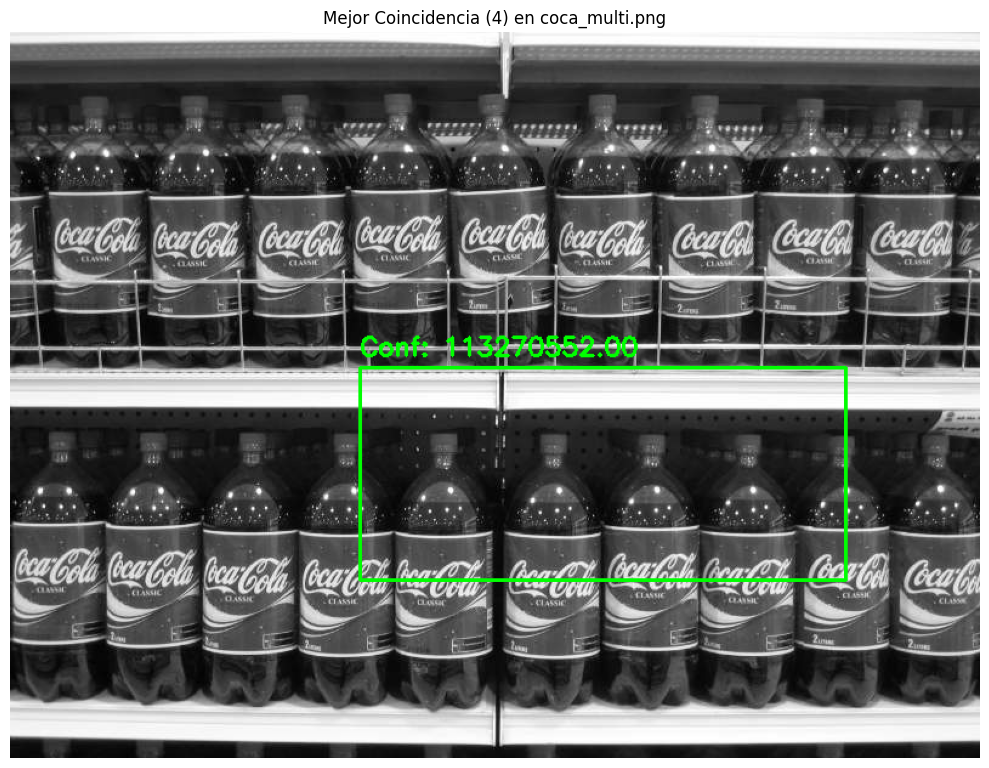

  - Método: 5, Confianza: 0.3216, Rect: (288, 276, 400, 175)
  - Método: 2, Confianza: 1963744000.0000, Rect: (373, 135, 400, 175)


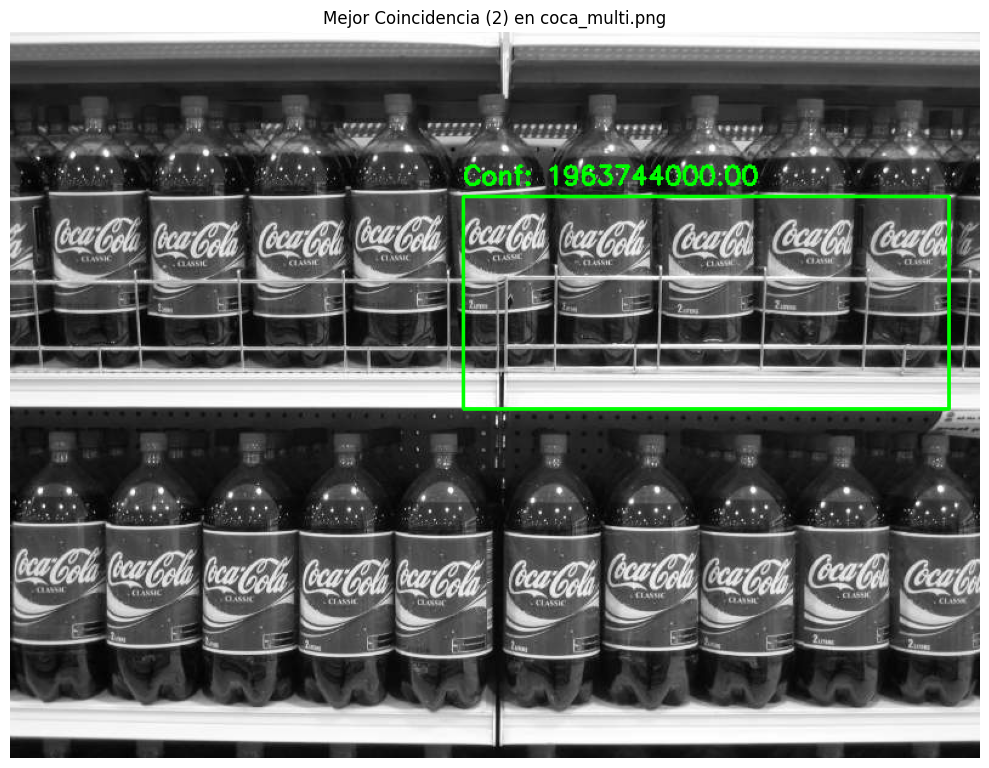

  - Método: 3, Confianza: 0.8515, Rect: (372, 133, 400, 175)
  - Método: 0, Confianza: -1154912255.0000, Rect: (372, 135, 400, 175)
  - Método: 1, Confianza: 0.4998, Rect: (372, 135, 400, 175)

Realizando matching multiescala para coca_multi.png (num_scales=20):
  - Escala: 0.20, Confianza: 0.3704, Rect: (597, 227, 80, 35)
  - Escala: 0.29, Confianza: 0.3331, Rect: (657, 301, 117, 51)
  - Escala: 0.39, Confianza: 0.3562, Rect: (424, 18, 155, 68)
  - Escala: 0.48, Confianza: 0.3590, Rect: (404, 7, 193, 84)
  - Escala: 0.58, Confianza: 0.3526, Rect: (527, 0, 231, 101)
  - Escala: 0.67, Confianza: 0.3439, Rect: (439, 457, 269, 117)
  - Escala: 0.77, Confianza: 0.3601, Rect: (415, 444, 307, 134)
  - Escala: 0.86, Confianza: 0.3462, Rect: (285, 281, 345, 151)
  - Escala: 0.96, Confianza: 0.3360, Rect: (175, 277, 383, 167)
  - Escala: 1.05, Confianza: 0.3453, Rect: (376, 277, 421, 184)
  - Escala: 1.15, Confianza: 0.3304, Rect: (122, 273, 458, 200)
  - Escala: 1.24, Confianza: 0.2769, Rect: 

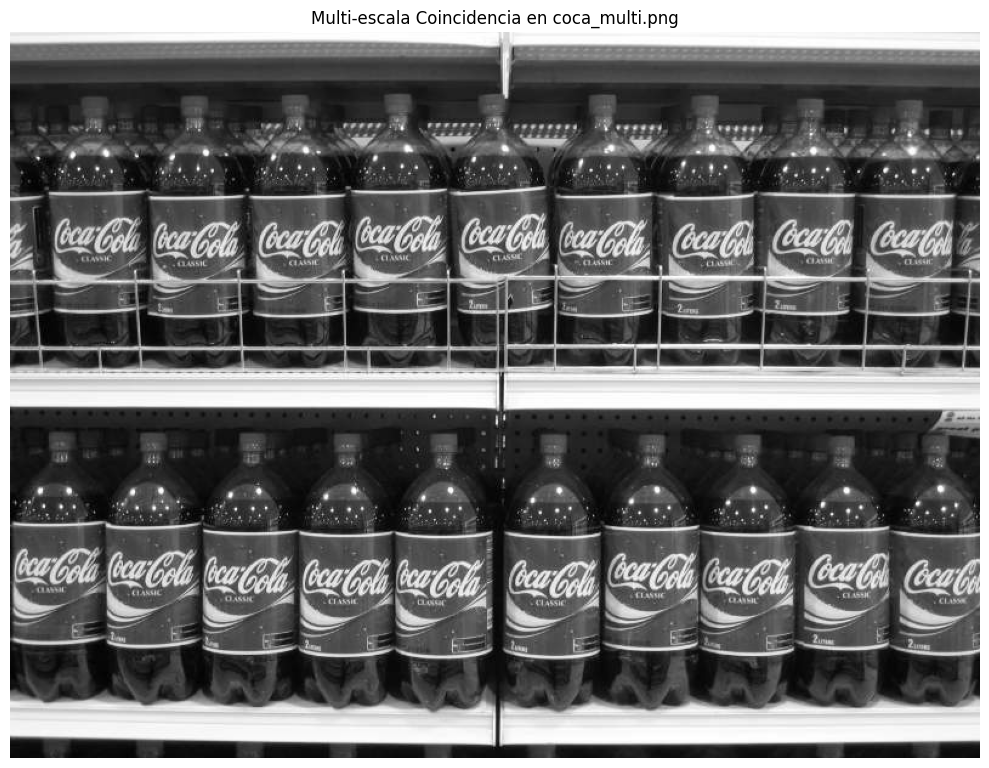


Realizando matching con bordes Canny para coca_multi.png (thresh1=100, thresh2=200):
  - Confianza (Canny): 0.0541, Rect: (8, 352, 400, 175)

Evaluando métricas para coca_retro_1.png:
  - Método: 4, Confianza: 114068200.0000, Rect: (108, 104, 400, 175)


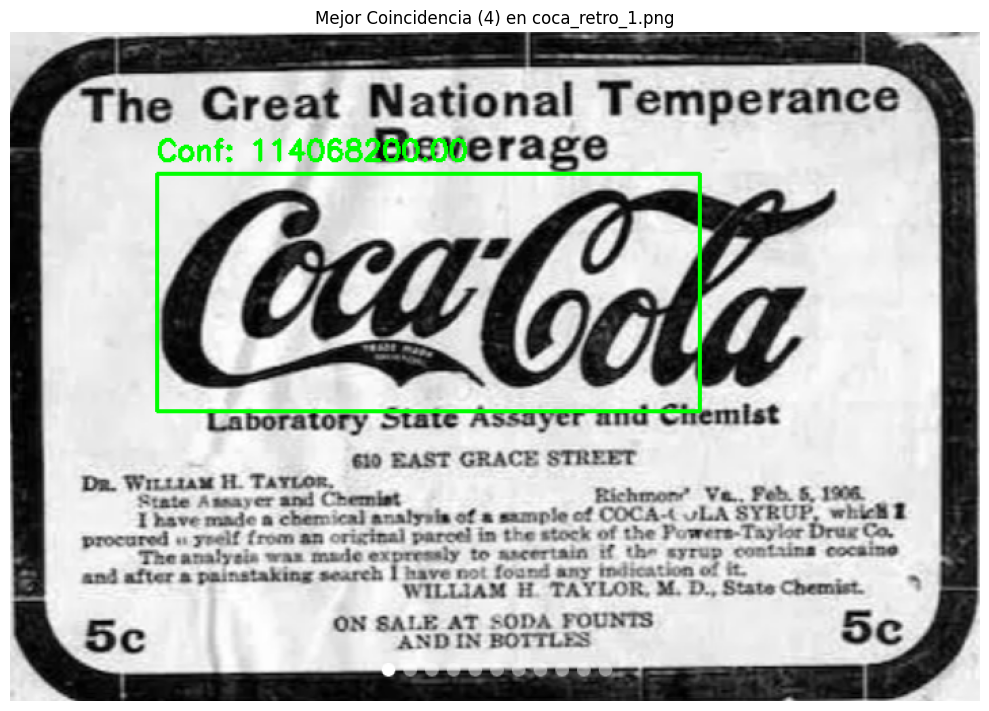

  - Método: 5, Confianza: 0.2699, Rect: (108, 104, 400, 175)
  - Método: 2, Confianza: 3181676032.0000, Rect: (27, 261, 400, 175)


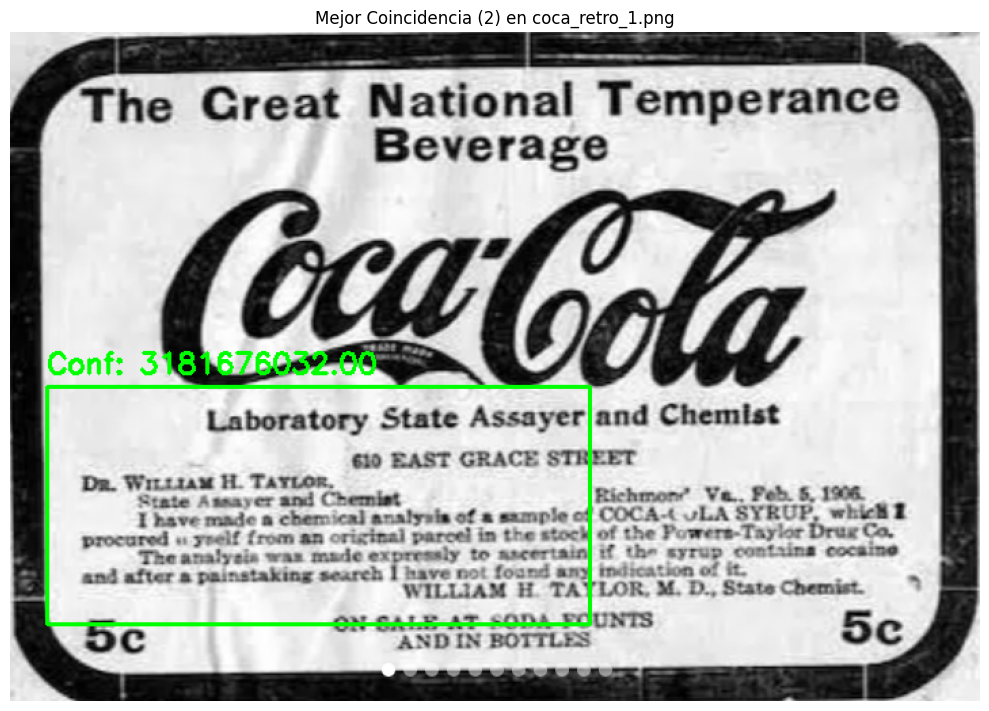

  - Método: 3, Confianza: 0.9487, Rect: (116, 293, 400, 175)
  - Método: 0, Confianza: -361401599.0000, Rect: (116, 293, 400, 175)
  - Método: 1, Confianza: 0.8921, Rect: (116, 293, 400, 175)

Realizando matching multiescala para coca_retro_1.png (num_scales=20):
  - Escala: 0.20, Confianza: 0.4255, Rect: (171, 35, 80, 35)
  - Escala: 0.29, Confianza: 0.3609, Rect: (476, 106, 117, 51)
  - Escala: 0.39, Confianza: 0.3333, Rect: (446, 94, 155, 68)
  - Escala: 0.48, Confianza: 0.2985, Rect: (487, 318, 193, 84)
  - Escala: 0.58, Confianza: 0.3315, Rect: (371, 173, 231, 101)
  - Escala: 0.67, Confianza: 0.3423, Rect: (345, 160, 269, 117)
  - Escala: 0.77, Confianza: 0.2587, Rect: (334, 144, 307, 134)
  - Escala: 0.86, Confianza: 0.2881, Rect: (95, 123, 345, 151)
  - Escala: 0.96, Confianza: 0.2700, Rect: (250, 113, 383, 167)
  - Escala: 1.05, Confianza: 0.3146, Rect: (161, 96, 421, 184)
  - Escala: 1.15, Confianza: 0.3969, Rect: (157, 85, 458, 200)
  - Escala: 1.24, Confianza: 0.4563, Rect:

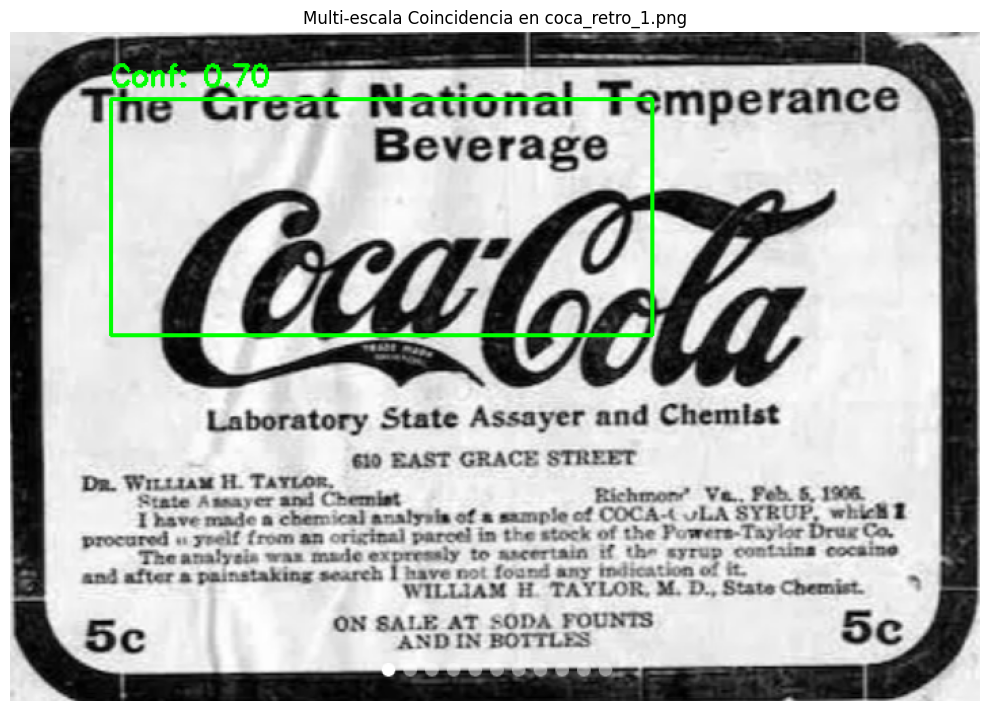


Realizando matching con bordes Canny para coca_retro_1.png (thresh1=100, thresh2=200):
  - Confianza (Canny): 0.0572, Rect: (99, 92, 400, 175)

Evaluando métricas para coca_logo_1.png:
  - Método: 4, Confianza: 0.0000, Rect: None
  - Método: 5, Confianza: 0.0000, Rect: None
  - Método: 2, Confianza: 0.0000, Rect: None
  - Método: 3, Confianza: 0.0000, Rect: None
  - Método: 0, Confianza: 0.0000, Rect: None
  - Método: 1, Confianza: 0.0000, Rect: None

Realizando matching multiescala para coca_logo_1.png (num_scales=20):
  - Escala: 0.20, Confianza: 0.3099, Rect: (59, 457, 80, 35)
  - Escala: 0.29, Confianza: 0.3184, Rect: (65, 443, 117, 51)
  - Escala: 0.39, Confianza: 0.2970, Rect: (32, 430, 155, 68)
  - Escala: 0.48, Confianza: 0.3025, Rect: (9, 416, 193, 84)


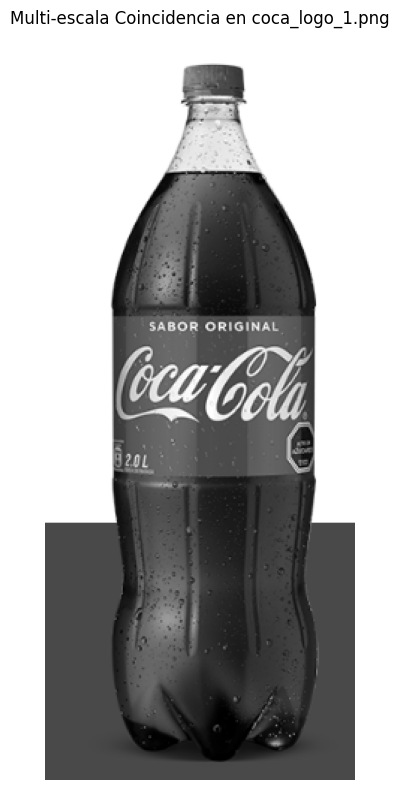


Realizando matching con bordes Canny para coca_logo_1.png (thresh1=100, thresh2=200):
  - Confianza (Canny): 0.0000, Rect: None

Evaluando métricas para coca_retro_2.png:
  - Método: 4, Confianza: 48848252.0000, Rect: (181, 232, 400, 175)


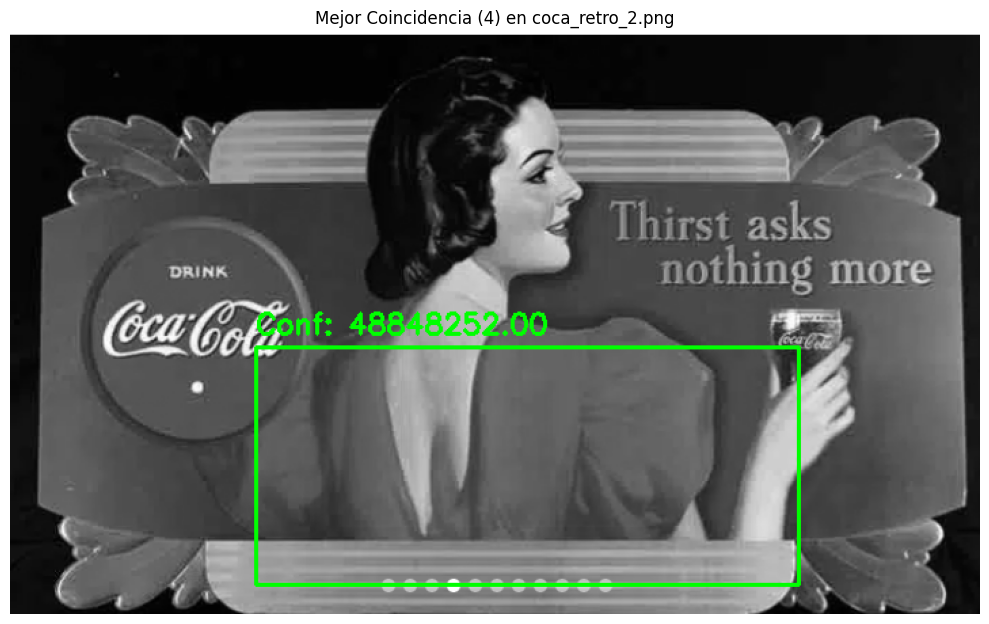

  - Método: 5, Confianza: 0.2829, Rect: (181, 231, 400, 175)
  - Método: 2, Confianza: 1804824704.0000, Rect: (186, 253, 400, 175)


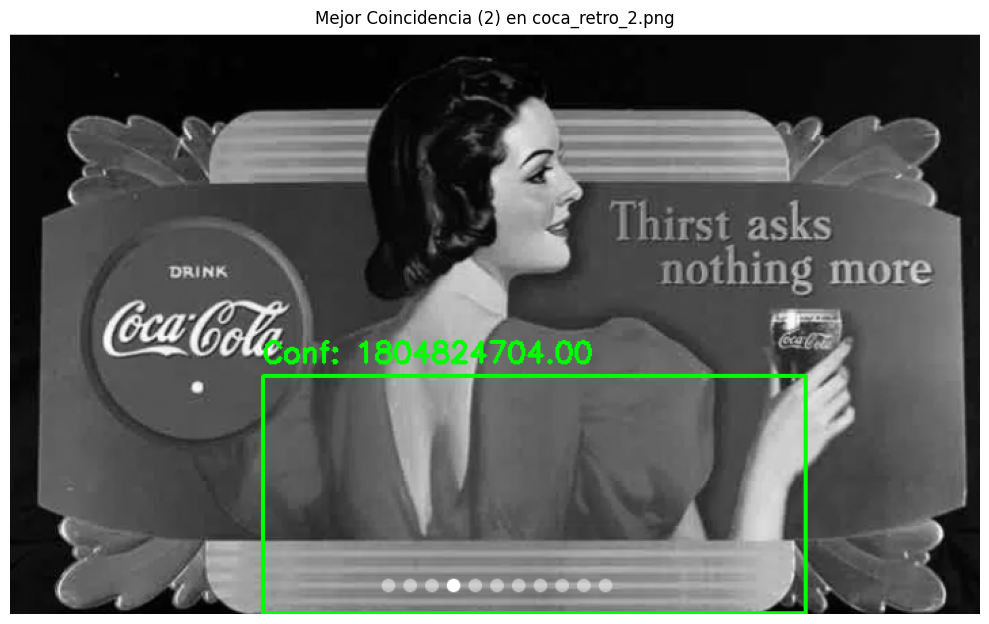

  - Método: 3, Confianza: 0.9341, Rect: (119, 230, 400, 175)
  - Método: 0, Confianza: -1053009919.0000, Rect: (180, 253, 400, 175)
  - Método: 1, Confianza: 0.4607, Rect: (183, 253, 400, 175)

Realizando matching multiescala para coca_retro_2.png (num_scales=20):
  - Escala: 0.20, Confianza: 0.3435, Rect: (501, 104, 80, 35)
  - Escala: 0.29, Confianza: 0.3600, Rect: (167, 332, 117, 51)
  - Escala: 0.39, Confianza: 0.3544, Rect: (352, 318, 155, 68)
  - Escala: 0.48, Confianza: 0.3539, Rect: (316, 305, 193, 84)
  - Escala: 0.58, Confianza: 0.3139, Rect: (333, 291, 231, 101)
  - Escala: 0.67, Confianza: 0.3148, Rect: (299, 277, 269, 117)
  - Escala: 0.77, Confianza: 0.2902, Rect: (268, 264, 307, 134)
  - Escala: 0.86, Confianza: 0.2760, Rect: (228, 249, 345, 151)
  - Escala: 0.96, Confianza: 0.2836, Rect: (189, 237, 383, 167)
  - Escala: 1.05, Confianza: 0.2561, Rect: (170, 223, 421, 184)
  - Escala: 1.15, Confianza: 0.2548, Rect: (123, 211, 458, 200)
  - Escala: 1.24, Confianza: 0.2325,

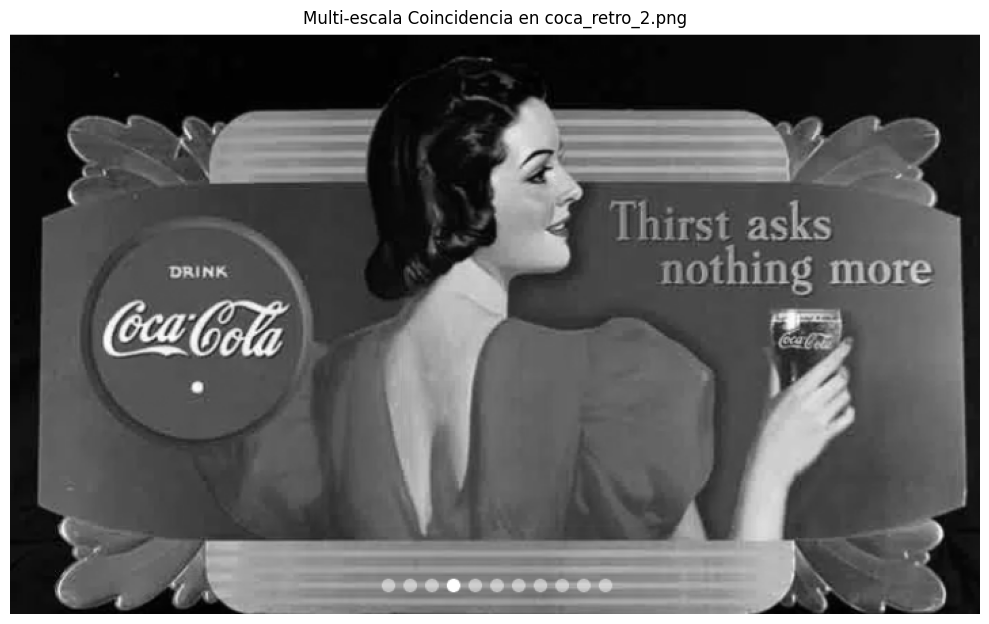


Realizando matching con bordes Canny para coca_retro_2.png (thresh1=100, thresh2=200):
  - Confianza (Canny): 0.0535, Rect: (39, 131, 400, 175)

Evaluando métricas para COCA-COLA-LOGO.jpg:
  - Método: 4, Confianza: 111417928.0000, Rect: (561, 11, 400, 175)


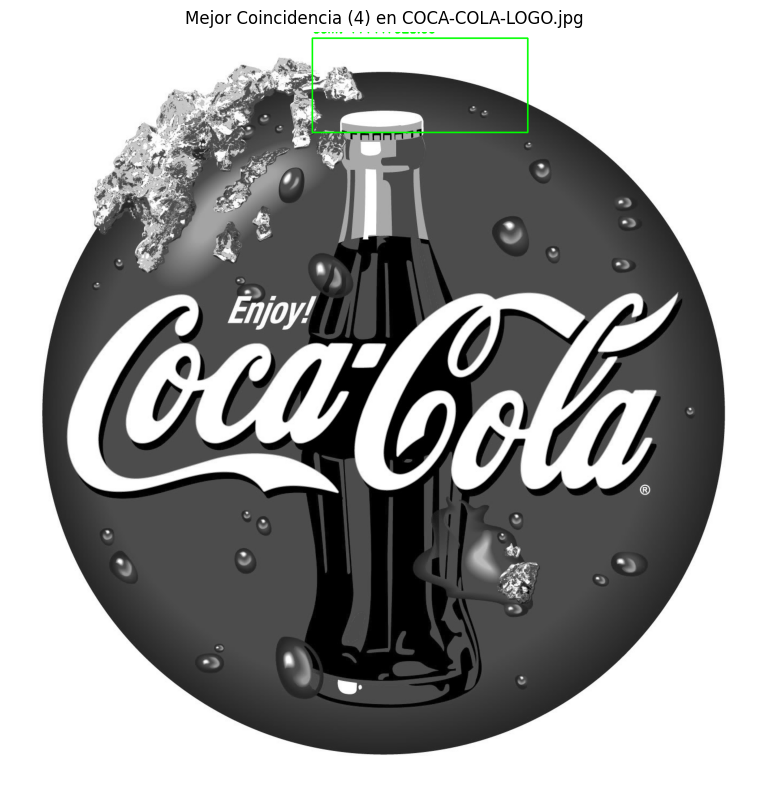

  - Método: 5, Confianza: 0.2840, Rect: (947, 785, 400, 175)
  - Método: 2, Confianza: 3855780352.0000, Rect: (989, 0, 400, 175)


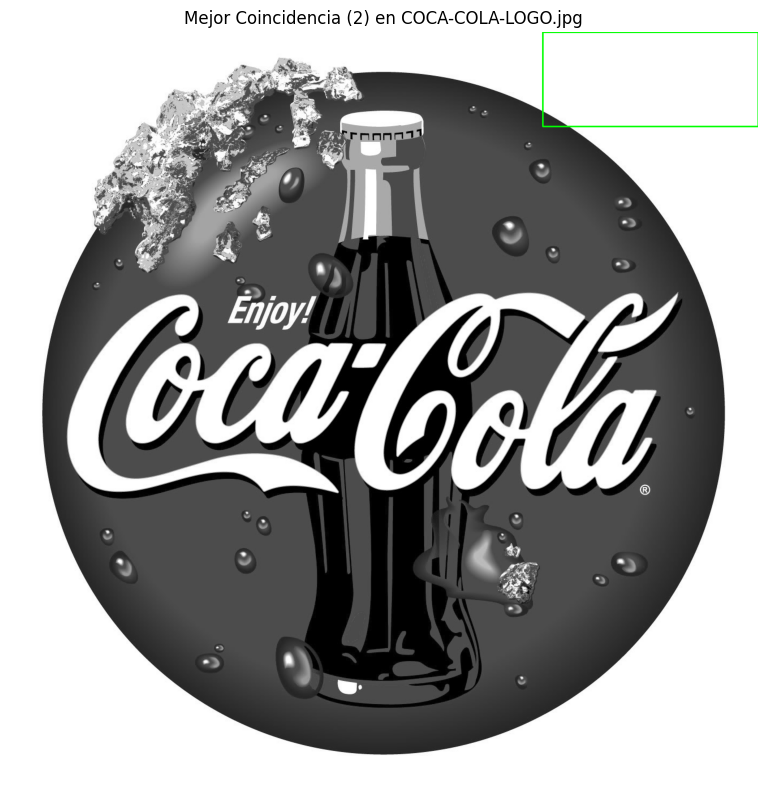

  - Método: 3, Confianza: 0.9569, Rect: (989, 0, 400, 175)
  - Método: 0, Confianza: -392528639.0000, Rect: (0, 0, 400, 175)
  - Método: 1, Confianza: 0.9013, Rect: (989, 0, 400, 175)

Realizando matching multiescala para COCA-COLA-LOGO.jpg (num_scales=20):
  - Escala: 0.20, Confianza: 0.3307, Rect: (182, 842, 80, 35)
  - Escala: 0.29, Confianza: 0.3314, Rect: (351, 742, 117, 51)
  - Escala: 0.39, Confianza: 0.3207, Rect: (383, 728, 155, 68)
  - Escala: 0.48, Confianza: 0.3181, Rect: (468, 727, 193, 84)
  - Escala: 0.58, Confianza: 0.3207, Rect: (628, 63, 231, 101)
  - Escala: 0.67, Confianza: 0.3087, Rect: (626, 50, 269, 117)
  - Escala: 0.77, Confianza: 0.3240, Rect: (625, 36, 307, 134)
  - Escala: 0.86, Confianza: 0.3081, Rect: (623, 24, 345, 151)
  - Escala: 0.96, Confianza: 0.2927, Rect: (955, 787, 383, 167)
  - Escala: 1.05, Confianza: 0.2617, Rect: (924, 798, 421, 184)
  - Escala: 1.15, Confianza: 0.2629, Rect: (882, 774, 458, 200)
  - Escala: 1.24, Confianza: 0.2920, Rect: (852

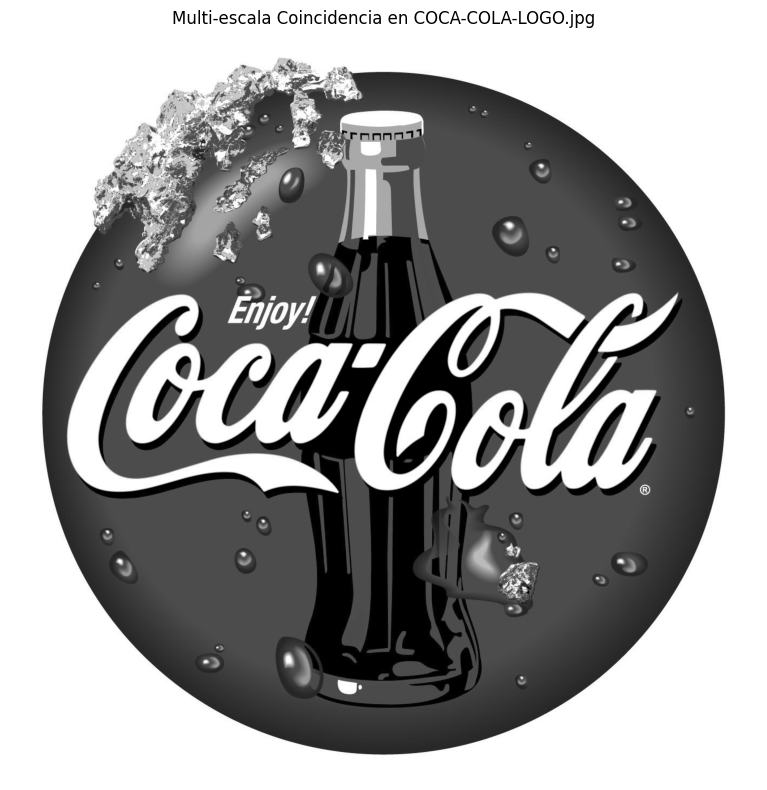


Realizando matching con bordes Canny para COCA-COLA-LOGO.jpg (thresh1=100, thresh2=200):
  - Confianza (Canny): 0.0584, Rect: (285, 10, 400, 175)

PROCESO DE ESTRATEGIAS AVANZADAS COMPLETADO



In [ ]:
results_dir_advanced_gray = "resultados_deteccion_avanzada_gray"
os.makedirs(results_dir_advanced_gray, exist_ok=True)
print(f"Directorio para resultados creado: {results_dir_advanced_gray}")

def load_images_gray(base_path, template_path, images_path):
    if not os.path.exists(template_path):
        print(f"ERROR: La ruta del template '{template_path}' no existe.")
        return None, {}
    if not os.path.exists(images_path):
        print(f"ERROR: La ruta de imágenes '{images_path}' no existe.")
        return None, {}
    template_files = glob.glob(os.path.join(template_path, "*"))
    if not template_files:
        print(f"ERROR: No se encontraron archivos de template en '{template_path}'")
        return None, {}
    template_color = cv2.imread(template_files[0])
    if template_color is None:
        print(f"ERROR: No se pudo cargar el template: {template_files[0]}")
        return None, {}
    template_gray = cv2.cvtColor(template_color, cv2.COLOR_BGR2GRAY)
    print(f"Template cargado (grayscale): {os.path.basename(template_files[0])} - {template_gray.shape}")
    image_files = glob.glob(os.path.join(images_path, "*.png")) + glob.glob(os.path.join(images_path, "*.jpg"))
    if not image_files:
        print(f"ERROR: No se encontraron imágenes en '{images_path}'")
        return template_gray, {}
    images = {}
    for img_path in image_files:
        img_name = os.path.basename(img_path)
        img_color = cv2.imread(img_path)
        if img_color is not None:
            img_gray = cv2.cvtColor(img_color, cv2.COLOR_BGR2GRAY)
            images[img_name] = img_gray
            print(f"Imagen cargada (grayscale): {img_name} - {img_gray.shape}")
        else:
            print(f"ADVERTENCIA: No se pudo cargar la imagen: {img_path}")
    print(f"\nTotal: {len(images)} imágenes cargadas")
    return template_gray, images

template_gray, images_gray = load_images_gray(base_path, template_path, images_path)

if template_gray is not None:
    plt.figure(figsize=(4, 4))
    plt.imshow(template_gray, cmap='gray')
    plt.title("Template (Grayscale)")
    plt.axis('off')
    plt.show()
    print(f"Dimensiones del template (grayscale): {template_gray.shape}")


def detect_single_logo_base_gray(image_gray, template_gray, method):
    h_img, w_img = image_gray.shape[:2]
    h_temp, w_temp = template_gray.shape[:2]
    if h_img < h_temp or w_img < w_temp:
        return None, 0.0, None
    result = cv2.matchTemplate(image_gray, template_gray, method)
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)
    if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
        match_loc = min_loc
        match_val = 1 - min_val
    else:
        match_loc = max_loc
        match_val = max_val
    h, w = template_gray.shape[:2]
    match_rect = (match_loc[0], match_loc[1], w, h)
    return match_rect, match_val, result

def draw_detection_gray(image_gray, match_rect, confidence, title="Detección de Logo (Grayscale)"):
    result_img = cv2.cvtColor(image_gray, cv2.COLOR_GRAY2BGR).copy()
    if match_rect is not None:
        x, y, w, h = match_rect
        cv2.rectangle(result_img, (x, y), (x + w, y + h), (0, 255, 0), 2)
        text = f"Conf: {confidence:.2f}"
        cv2.putText(result_img, text, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)
    plt.figure(figsize=(10, 8))
    plt.imshow(cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.axis('off')
    plt.tight_layout()
    plt.show()
    return result_img

def evaluate_metrics(image_gray, template_gray, name):
    print(f"\nEvaluando métricas para {name}:")
    metrics = [cv2.TM_CCOEFF, cv2.TM_CCOEFF_NORMED, cv2.TM_CCORR,
               cv2.TM_CCORR_NORMED, cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]
    best_match = None
    best_confidence = -1
    best_method = None
    best_result_img = None

    for method in metrics:
        match_rect, confidence, _ = detect_single_logo_base_gray(image_gray, template_gray, method)
        print(f"  - Método: {method}, Confianza: {confidence:.4f}, Rect: {match_rect}")
        if match_rect is not None and confidence > best_confidence:
            best_confidence = confidence
            best_match = match_rect
            best_method = method
            best_result_img = draw_detection_gray(image_gray, best_match, best_confidence, f"Mejor Coincidencia ({method}) en {name}")
        elif match_rect is not None and best_match is None:
            best_confidence = confidence
            best_match = match_rect
            best_method = method
            best_result_img = draw_detection_gray(image_gray, best_match, best_confidence, f"Mejor Coincidencia ({method}) en {name}")

    if best_result_img is not None:
        output_path = os.path.join(results_dir_advanced_gray, f"best_metric_{name}.png")
        cv2.imwrite(output_path, cv2.cvtColor(best_result_img, cv2.COLOR_RGB2BGR))


def multi_scale_matching(image_gray, template_gray, name, num_scales=20, threshold=0.6):
    print(f"\nRealizando matching multiescala para {name} (num_scales={num_scales}):")
    h_template, w_template = template_gray.shape[:2]
    best_match = None
    best_confidence = -1
    best_scaled_template = None

    for scale in np.linspace(0.2, 2.0, num_scales):
        resized_template = cv2.resize(template_gray, (int(w_template * scale), int(h_template * scale)))
        if resized_template.shape[0] > image_gray.shape[0] or resized_template.shape[1] > image_gray.shape[1]:
            continue
        match_rect, confidence, _ = detect_single_logo_base_gray(image_gray, resized_template, cv2.TM_CCOEFF_NORMED)
        print(f"  - Escala: {scale:.2f}, Confianza: {confidence:.4f}, Rect: {match_rect}")
        if match_rect is not None and confidence > best_confidence:
            best_confidence = confidence
            best_match = (int(match_rect[0] / scale), int(match_rect[1] / scale), int(match_rect[2] / scale), int(match_rect[3] / scale))
            best_scaled_template = resized_template

    if best_match is not None:
        result_img = draw_detection_gray(image_gray, best_match, best_confidence, f"Multi-escala Coincidencia en {name}")
        output_path = os.path.join(results_dir_advanced_gray, f"multiscale_{name}.png")
        cv2.imwrite(output_path, cv2.cvtColor(result_img, cv2.COLOR_RGB2BGR))

# Preprocesamiento con bordes Canny
def canny_edge_matching(image_gray, template_gray, name, threshold1=100, threshold2=200):
    print(f"\nRealizando matching con bordes Canny para {name} (thresh1={threshold1}, thresh2={threshold2}):")
    template_edges = cv2.Canny(template_gray, threshold1, threshold2)
    image_edges = cv2.Canny(image_gray, threshold1, threshold2)

    match_rect, confidence, _ = detect_single_logo_base_gray(image_edges, template_edges, cv2.TM_CCOEFF_NORMED)
    print(f"  - Confianza (Canny): {confidence:.4f}, Rect: {match_rect}")

    if match_rect is not None and confidence > 0.4: # Umbral para Canny
        result_img = draw_detection_gray(image_gray, match_rect, confidence, f"Canny Edge Matching en {name}")
        output_path = os.path.join(results_dir_advanced_gray, f"canny_{name}.png")
        cv2.imwrite(output_path, cv2.cvtColor(result_img, cv2.COLOR_RGB2BGR))

#  Ejecutar las estrategias avanzadas
print("\n" + "="*70)
print("EJECUTANDO ESTRATEGIAS AVANZADAS (ESCALA DE GRISES)")
print("="*70 + "\n")

for name, img_gray in images_gray.items():
    evaluate_metrics(img_gray, template_gray, name)
    multi_scale_matching(img_gray, template_gray, name)
    canny_edge_matching(img_gray, template_gray, name)

print("\n" + "="*70)
print("PROCESO DE ESTRATEGIAS AVANZADAS COMPLETADO")
print("="*70 + "\n")

# Conclusiones:

  Luego de observados estos resultados podemos determinar que al reescalar, convertir a escala de grises y probar varios mètodos se obtienen varias mejoras.

  La primera evidentemente es que al reescalar, las imagenes que eran menores que el template pueden ser procesadas. Por otro lado también se observa que variando el método y el intervalo de confianza podemos arribar a resultados más cercanos a los buscados.